In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score, silhouette_score, davies_bouldin_score

In [2]:
df=pd.read_csv(r"C:\Users\rohit\Downloads\Spotify\data.csv")

In [3]:
print("Initial Dataset:")
df.head()

Initial Dataset:


,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [4]:
print("\nMissing Values in Each Column:")
print(df.isnull().sum())


Missing Values in Each Column:
Unnamed: 0          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
target              0
song_title          0
artist              0
dtype: int64


In [5]:
df = df.dropna()

In [6]:
print("\nNumber of Duplicates:", df.duplicated().sum())
df = df.drop_duplicates()


Number of Duplicates: 0


In [7]:
columns_to_drop = ["track_id", "key", "mode", "time_signature"]
df = df.drop(columns=columns_to_drop, errors="ignore")

In [8]:
features = ["danceability", "energy", "tempo", "acousticness", "valence", "loudness", "speechiness", "instrumentalness"]
X = df[features]


In [9]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [10]:
X_scaled = pd.DataFrame(X_scaled, columns=features)

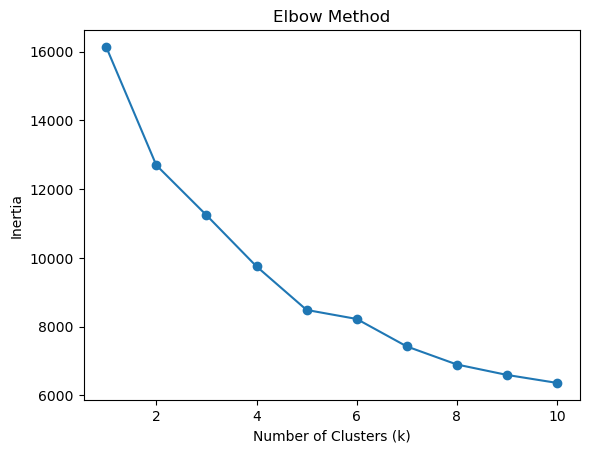

In [11]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method")
plt.show()

In [12]:
features = ["danceability", "energy", "tempo", "acousticness", "valence", "loudness", "speechiness", "instrumentalness"]
X = df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)

df["kmeans_cluster"] = kmeans_labels

kmeans_silhouette = silhouette_score(X_scaled, kmeans_labels)
print("K-Means Silhouette Score:", kmeans_silhouette)

K-Means Silhouette Score: 0.20073331119933183


In [13]:

print("Shape of X_scaled:", X_scaled.shape)
print("Shape of data:", df.shape)

if X_scaled.shape[0] != df.shape[0]:
    print("Mismatch in rows. Check for missing values or filtering steps.")
else:
    kmeans = KMeans(n_clusters=5, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    df["cluster"] = clusters 

    print(df.head())

Shape of X_scaled: (2017, 8)
Shape of data: (2017, 15)
   Unnamed: 0  acousticness  danceability  duration_ms  energy  \
0           0        0.0102         0.833       204600   0.434   
1           1        0.1990         0.743       326933   0.359   
2           2        0.0344         0.838       185707   0.412   
3           3        0.6040         0.494       199413   0.338   
4           4        0.1800         0.678       392893   0.561   

   instrumentalness  liveness  loudness  speechiness    tempo  valence  \
0          0.021900    0.1650    -8.795       0.4310  150.062    0.286   
1          0.006110    0.1370   -10.401       0.0794  160.083    0.588   
2          0.000234    0.1590    -7.148       0.2890   75.044    0.173   
3          0.510000    0.0922   -15.236       0.0261   86.468    0.230   
4          0.512000    0.4390   -11.648       0.0694  174.004    0.904   

   target      song_title            artist  kmeans_cluster  cluster  
0       1        Mask Off       

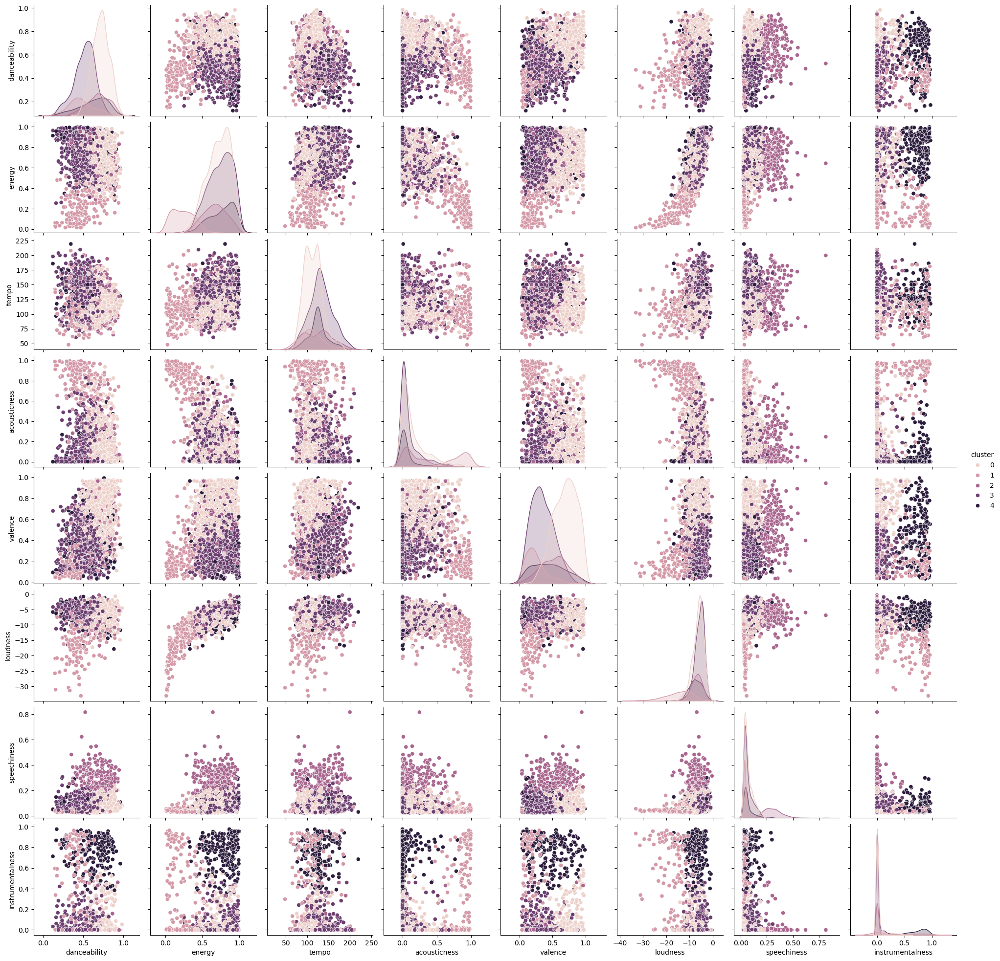

         danceability    energy       tempo  acousticness   valence  \
cluster                                                               
0            0.717457  0.717852  113.470615      0.153044  0.687862   
1            0.478589  0.236323  110.858739      0.801040  0.244548   
2            0.683791  0.666123  124.876632      0.172342  0.523389   
3            0.515895  0.740415  131.841627      0.100502  0.347629   
4            0.621816  0.766212  125.653456      0.071552  0.446882   

          loudness  speechiness  instrumentalness  
cluster                                            
0        -6.333907     0.069967          0.029390  
1       -14.819894     0.043253          0.347704  
2        -7.010295     0.307950          0.016581  
3        -5.721172     0.068165          0.025612  
4        -7.397756     0.067119          0.755147  


In [14]:
import seaborn as sns

sns.pairplot(df, hue="cluster", vars=features)
plt.show()

cluster_means = df.groupby("cluster")[features].mean()
print(cluster_means)

In [15]:

X_train, X_test, y_train, y_test = train_test_split(X_scaled, kmeans_labels, test_size=0.2, random_state=42)

clf = DecisionTreeClassifier(random_state=42, max_depth=3)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Accuracy:", accuracy_score(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       147
           1       0.94      0.84      0.89        37
           2       0.97      0.85      0.91        41
           3       0.64      0.81      0.71       137
           4       0.89      0.40      0.56        42

    accuracy                           0.75       404
   macro avg       0.84      0.73      0.77       404
weighted avg       0.78      0.75      0.75       404

Accuracy: 0.7524752475247525


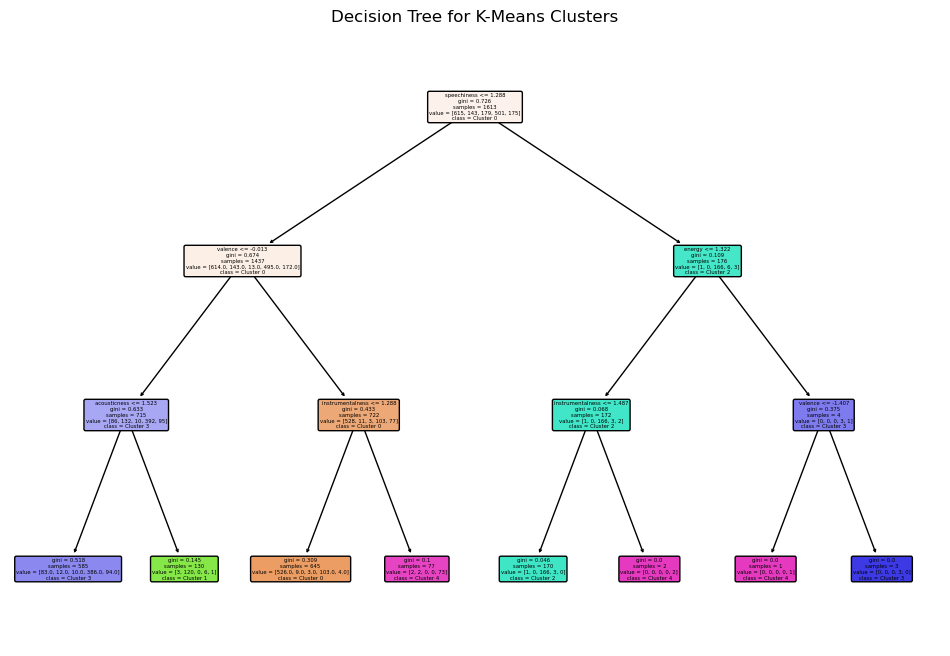

In [16]:

plt.figure(figsize=(12, 8))
plot_tree(clf, feature_names=features, class_names=[f"Cluster {i}" for i in range(5)], filled=True, rounded=True)
plt.title("Decision Tree for K-Means Clusters")
plt.show()

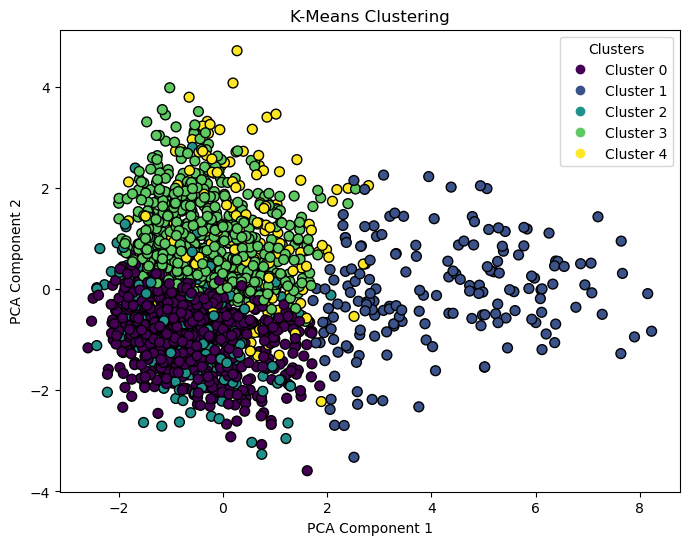

In [17]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1], c=kmeans_labels, cmap="viridis", marker="o", edgecolor="k", s=50
)

legend_labels = np.unique(kmeans_labels)
legend = plt.legend(
    handles=scatter.legend_elements()[0], labels=[f"Cluster {i}" for i in legend_labels], title="Clusters"
)

plt.title("K-Means Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.show()


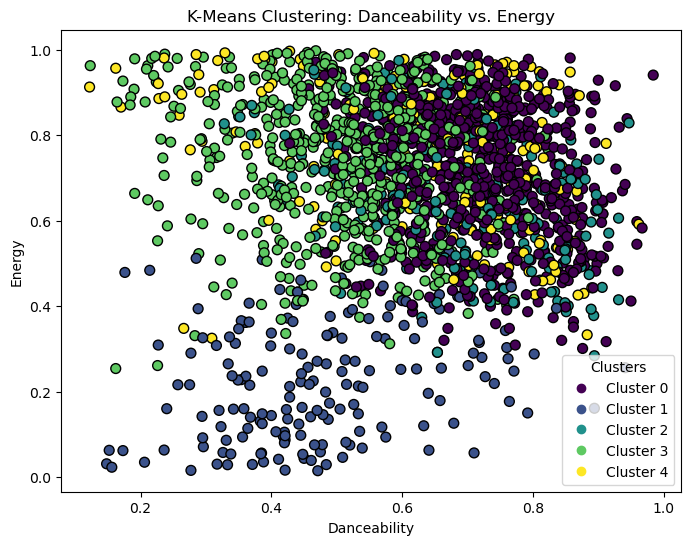

In [18]:
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    df["danceability"], df["energy"], c=kmeans_labels, cmap="viridis", marker="o", edgecolor="k", s=50
)

# Create a legend
legend_labels = np.unique(kmeans_labels)
legend = plt.legend(
    handles=scatter.legend_elements()[0], labels=[f"Cluster {i}" for i in legend_labels], title="Clusters"
)

plt.title("K-Means Clustering: Danceability vs. Energy")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.show()


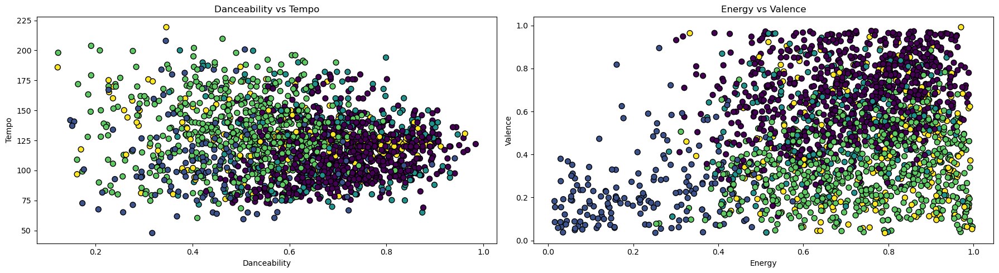

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(18, 5))  # Three plots side by side

# Danceability vs Tempo
axes[0].scatter(df["danceability"], df["tempo"], c=kmeans_labels, cmap="viridis", edgecolor="k", s=50)
axes[0].set_xlabel("Danceability")
axes[0].set_ylabel("Tempo")
axes[0].set_title("Danceability vs Tempo")

# Energy vs Valence
axes[1].scatter(df["energy"], df["valence"], c=kmeans_labels, cmap="viridis", edgecolor="k", s=50)
axes[1].set_xlabel("Energy")
axes[1].set_ylabel("Valence")
axes[1].set_title("Energy vs Valence")

plt.tight_layout()
plt.show()


In [20]:

for cluster_id, row in cluster_means.iterrows():
    print(f"Cluster {cluster_id}:")
    print(f"  - Danceability: {row['danceability']:.2f}")
    print(f"  - Energy: {row['energy']:.2f}")
    print(f"  - Acousticness: {row['acousticness']:.2f}")
    print(f"  - Tempo: {row['tempo']:.2f}")
    print()

Cluster 0:
  - Danceability: 0.72
  - Energy: 0.72
  - Acousticness: 0.15
  - Tempo: 113.47

Cluster 1:
  - Danceability: 0.48
  - Energy: 0.24
  - Acousticness: 0.80
  - Tempo: 110.86

Cluster 2:
  - Danceability: 0.68
  - Energy: 0.67
  - Acousticness: 0.17
  - Tempo: 124.88

Cluster 3:
  - Danceability: 0.52
  - Energy: 0.74
  - Acousticness: 0.10
  - Tempo: 131.84

Cluster 4:
  - Danceability: 0.62
  - Energy: 0.77
  - Acousticness: 0.07
  - Tempo: 125.65



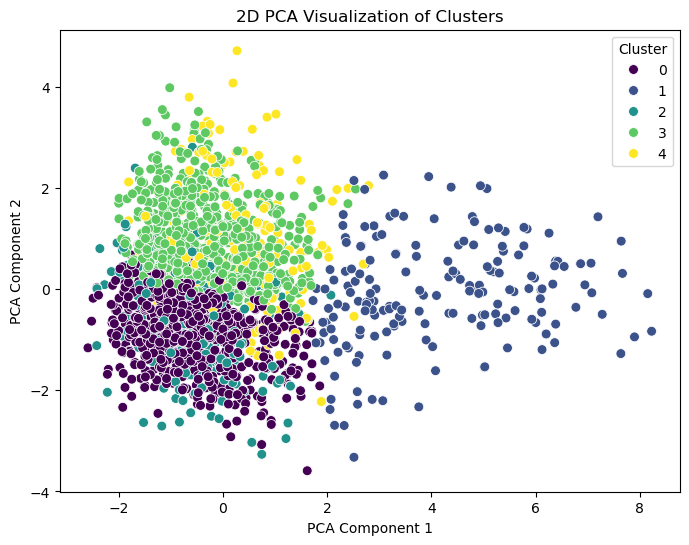

In [21]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df["cluster"], palette="viridis", s=50)
plt.title("2D PCA Visualization of Clusters")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()

In [32]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

db_index = davies_bouldin_score(X_scaled, df["cluster"])
ch_index = calinski_harabasz_score(X_scaled, df["cluster"])

print("Davies-Bouldin Index:", db_index)
print("Calinski-Harabasz Index:", ch_index)

Davies-Bouldin Index: 1.4703877011320088
Calinski-Harabasz Index: 453.3246290641244


In [33]:
# Check if the columns exist
if "song_title" in df.columns and "artist" in df.columns:
    # Example: Create a playlist for Cluster 0
    cluster_0_songs = df[df["cluster"] == 0]
    print("Songs in Cluster 0:")
    print(cluster_0_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

Songs in Cluster 0:
                    song_title              artist
1                      Redbone    Childish Gambino
6                  Childs Play               Drake
11  Donme Dolap - Baris K Edit  Modern Folk Üçlüsü
13                   One Night          Lil Yachty
16             World In Motion           New Order


In [34]:
# Analyze Cluster 0 using available features
cluster_0_songs = df[df["cluster"] == 0]
print("Songs in Cluster 0:")
print(cluster_0_songs[features].head())  # Use the audio features instead

Songs in Cluster 0:
    danceability  energy    tempo  acousticness  valence  loudness  \
1          0.743   0.359  160.083        0.1990    0.588   -10.401   
6          0.739   0.472   80.030        0.0145    0.308   -11.204   
11         0.753   0.748  104.322        0.0915    0.642    -8.620   
13         0.762   0.476  130.007        0.3660    0.367   -12.686   
16         0.603   0.955  123.922        0.0239    0.773    -4.111   

    speechiness  instrumentalness  
1        0.0794          0.006110  
6        0.1560          0.000007  
11       0.0494          0.003480  
13       0.1140          0.000000  
16       0.0458          0.045100  


In [35]:
if "song_title" in df.columns and "artist" in df.columns:
    cluster_1_songs = df[df["cluster"] == 1]
    print("Songs in Cluster 1:")
    print(cluster_1_songs[["song_title", "artist"]].head())

Songs in Cluster 1:
                song_title                         artist
3           Master Of None                    Beach House
57                     L$D                     A$AP Rocky
60                    Baby  Ariel Pink's Haunted Graffiti
78  Words I Don't Remember              How To Dress Well
98  The Gaudy Side of Town                         Gayngs


In [36]:

if "song_title" in df.columns and "artist" in df.columns:
    cluster_0_songs = df[df["cluster"] == 0]
    print("Songs in Cluster 0:")
    print(cluster_0_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

cluster_0_songs = df[df["cluster"] == 0]
print("Features:")
print(cluster_0_songs[features].head()) 



if "song_title" in df.columns and "artist" in df.columns:
    cluster_1_songs = df[df["cluster"] == 1]
    print("Songs in Cluster 1:")
    print(cluster_1_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

cluster_1_songs = df[df["cluster"] == 1]
print("Features:")
print(cluster_1_songs[features].head()) 



if "song_title" in df.columns and "artist" in df.columns:
    cluster_2_songs = df[df["cluster"] == 2]
    print("Songs in Cluster 2:")
    print(cluster_2_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

cluster_2_songs = df[df["cluster"] == 2]
print("Features:")
print(cluster_2_songs[features].head()) 




if "song_title" in df.columns and "artist" in df.columns:
    cluster_3_songs = df[df["cluster"] == 3]
    print("Songs in Cluster 3:")
    print(cluster_3_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

cluster_3_songs = df[df["cluster"] == 3]
print("Features:")
print(cluster_3_songs[features].head()) 




if "song_title" in df.columns and "artist" in df.columns:
    cluster_4_songs = df[df["cluster"] == 4]
    print("Songs in Cluster 4:")
    print(cluster_4_songs[["song_title", "artist"]].head())
else:
    print("Columns 'song_title' and 'artist' are missing. Skipping this step.")

cluster_4_songs = df[df["cluster"] == 4]
print("Features:")
print(cluster_4_songs[features].head()) 

Songs in Cluster 0:
                    song_title              artist
1                      Redbone    Childish Gambino
6                  Childs Play               Drake
11  Donme Dolap - Baris K Edit  Modern Folk Üçlüsü
13                   One Night          Lil Yachty
16             World In Motion           New Order
Features:
    danceability  energy    tempo  acousticness  valence  loudness  \
1          0.743   0.359  160.083        0.1990    0.588   -10.401   
6          0.739   0.472   80.030        0.0145    0.308   -11.204   
11         0.753   0.748  104.322        0.0915    0.642    -8.620   
13         0.762   0.476  130.007        0.3660    0.367   -12.686   
16         0.603   0.955  123.922        0.0239    0.773    -4.111   

    speechiness  instrumentalness  
1        0.0794          0.006110  
6        0.1560          0.000007  
11       0.0494          0.003480  
13       0.1140          0.000000  
16       0.0458          0.045100  
Songs in Cluster 1:
       

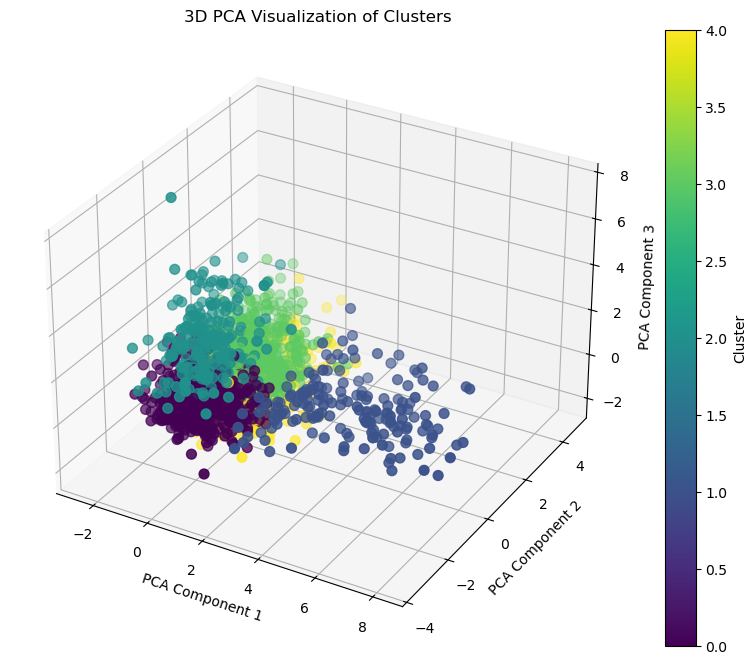

In [38]:
from mpl_toolkits.mplot3d import Axes3D

# Apply PCA for 3D visualization
pca = PCA(n_components=3)
X_pca_3d = pca.fit_transform(X_scaled)

# Plot clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")
scatter = ax.scatter(X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2], c=df["cluster"], cmap="viridis", s=50)
plt.title("3D PCA Visualization of Clusters")
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_zlabel("PCA Component 3")
plt.colorbar(scatter, label="Cluster")
plt.show()

In [41]:
df["song_title"] = df["song_title"].str.replace(r"[^\w\s]", "", regex=True)


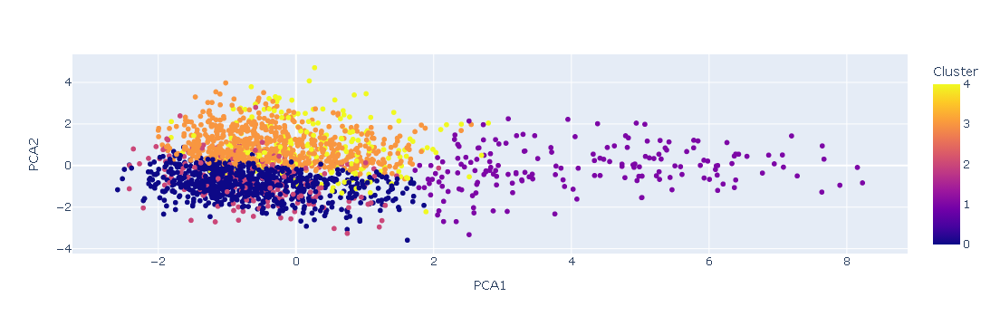

In [42]:
import plotly.express as px

df_pca = pd.DataFrame(X_pca, columns=["PCA1", "PCA2"])
df_pca["Cluster"] = df["cluster"]
df_pca["Song"] = df["song_title"] + " - " + df["artist"]

fig = px.scatter(df_pca, x="PCA1", y="PCA2", color="Cluster", hover_data=["Song"])
fig.show()


In [43]:
cluster_means = df.groupby("cluster")[["tempo", "danceability", "energy", "acousticness"]].mean()
print(cluster_means)


              tempo  danceability    energy  acousticness
cluster                                                  
0        113.470615      0.717457  0.717852      0.153044
1        110.858739      0.478589  0.236323      0.801040
2        124.876632      0.683791  0.666123      0.172342
3        131.841627      0.515895  0.740415      0.100502
4        125.653456      0.621816  0.766212      0.071552


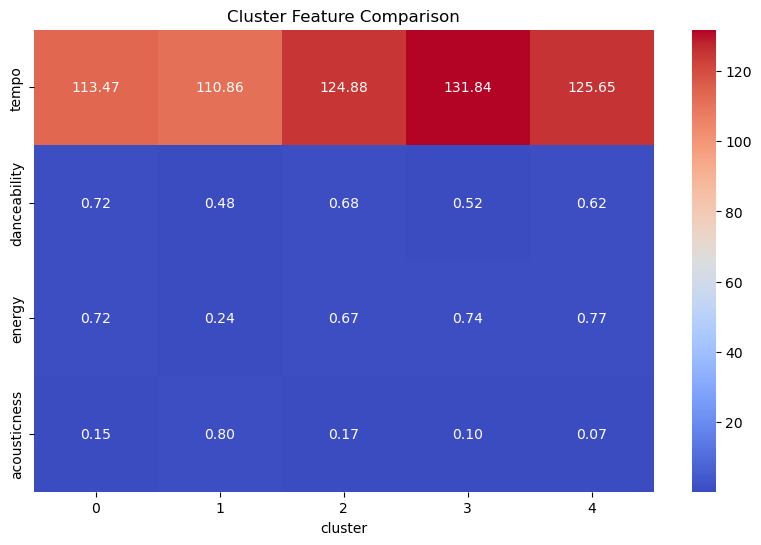

In [44]:
import numpy as np

# Round values for better readability
cluster_means_rounded = np.round(cluster_means, 2)

# Plot the heatmap again
plt.figure(figsize=(10,6))
sns.heatmap(cluster_means_rounded.T, cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Cluster Feature Comparison")
plt.show()


In [45]:
from sklearn.preprocessing import StandardScaler

# Select only numerical features for clustering
feature_cols = ["tempo", "danceability", "energy", "acousticness"]
X = df[feature_cols]  

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [46]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=3, random_state=42)
df["gmm_cluster"] = gmm.fit_predict(X_scaled)

print("GMM Clusters Assigned:", df["gmm_cluster"].value_counts())


GMM Clusters Assigned: gmm_cluster
1    760
2    690
0    567
Name: count, dtype: int64


In [47]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust parameters if needed
df["dbscan_cluster"] = dbscan.fit_predict(X_scaled)

print("DBSCAN Clusters Assigned:", df["dbscan_cluster"].value_counts())


DBSCAN Clusters Assigned: dbscan_cluster
 0     1493
-1      416
 6       33
 1        9
 3        8
 4        7
 2        6
 9        6
 14       6
 5        6
 12       6
 8        5
 10       5
 7        4
 11       4
 13       3
Name: count, dtype: int64


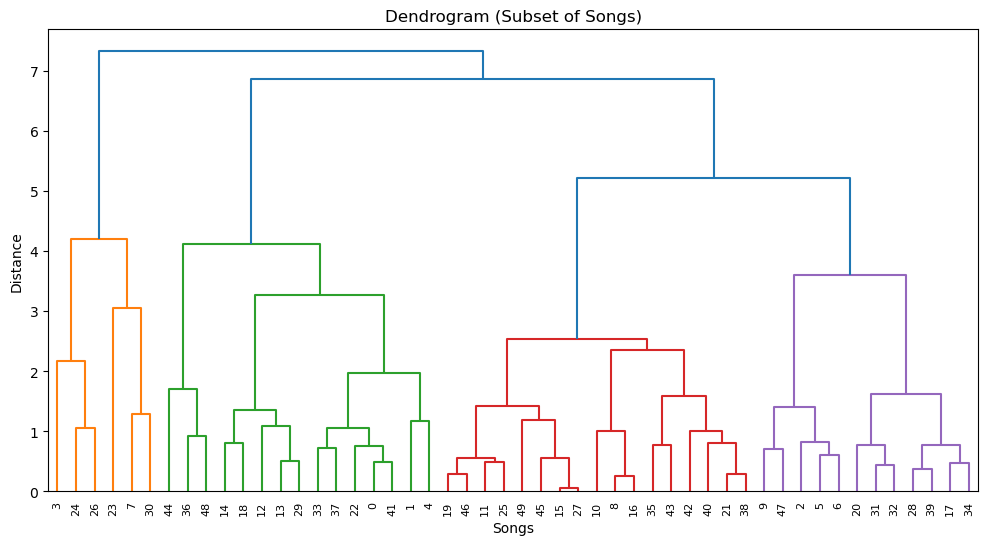

In [48]:
import scipy.cluster.hierarchy as sch

subset = X_scaled[:50] 

plt.figure(figsize=(12, 6))
sch.dendrogram(sch.linkage(subset, method="ward"))
plt.title("Dendrogram (Subset of Songs)")
plt.xlabel("Songs")
plt.ylabel("Distance")
plt.show()


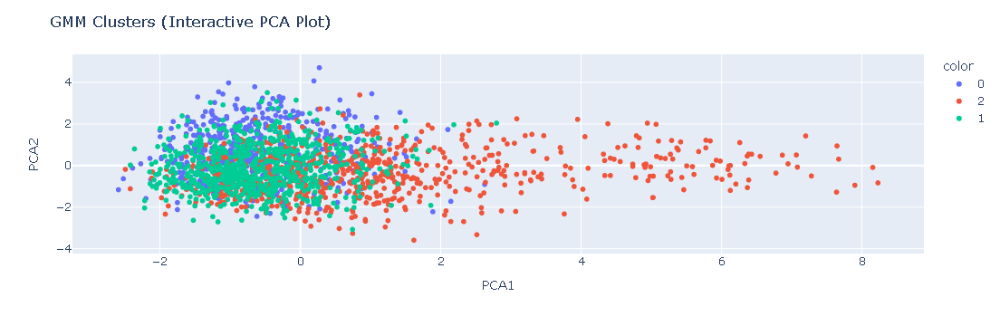

In [49]:
fig = px.scatter(df_pca, x="PCA1", y="PCA2", color=df["gmm_cluster"].astype(str), hover_data=["Song"])
fig.update_layout(title="GMM Clusters (Interactive PCA Plot)")
fig.show()

In [50]:
pip install mlxtend


Note: you may need to restart the kernel to use updated packages.


In [51]:
from mlxtend.frequent_patterns import apriori, association_rules
playlist_data = {
    "Blinding Lights": [1, 0, 1, 1, 0],
    "Save Your Tears": [1, 1, 0, 1, 0],
    "Starboy": [0, 1, 1, 1, 1],
    "Levitating": [1, 0, 0, 1, 1],
    "Stay": [0, 1, 1, 0, 1]
}
df_playlist = pd.DataFrame(playlist_data)
freq_items = apriori(df_playlist, min_support=0.4, use_colnames=True)
rules = association_rules(freq_items, metric="lift", min_threshold=1.0)
print(rules[["antecedents", "consequents", "support", "confidence", "lift"]])


                           antecedents                         consequents  \
0                    (Blinding Lights)                   (Save Your Tears)   
1                    (Save Your Tears)                   (Blinding Lights)   
2                         (Levitating)                   (Blinding Lights)   
3                    (Blinding Lights)                        (Levitating)   
4                         (Levitating)                   (Save Your Tears)   
5                    (Save Your Tears)                        (Levitating)   
6                               (Stay)                           (Starboy)   
7                            (Starboy)                              (Stay)   
8        (Levitating, Blinding Lights)                   (Save Your Tears)   
9        (Levitating, Save Your Tears)                   (Blinding Lights)   
10  (Blinding Lights, Save Your Tears)                        (Levitating)   
11                        (Levitating)  (Blinding Lights, Save Y

C:\Users\rohit\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



In [52]:
from sklearn.metrics import silhouette_score
models = {"K-Means": df["kmeans_cluster"], "GMM": df["gmm_cluster"], "DBSCAN": df["dbscan_cluster"]}

for name, labels in models.items():
    if len(set(labels)) > 1:  # Avoid errors with single-cluster DBSCAN
        score = silhouette_score(X_scaled, labels)
        print(f"{name} Silhouette Score: {score:.2f}")


K-Means Silhouette Score: 0.05
GMM Silhouette Score: 0.02
DBSCAN Silhouette Score: -0.20


In [104]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# =========================
# Apply PCA for Dimensionality Reduction (Keep 98% variance)
pca = PCA(n_components=0.98)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# =========================
# Logistic Regression Model (On original data)
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print("Classification Report:\n", classification_report(y_test, y_pred_lr))

# =========================
# Support Vector Machine Model (On PCA data)
svm = SVC(kernel='rbf', C=1, gamma='scale')
svm.fit(X_train_pca, y_train)
y_pred_svm = svm.predict(X_test_pca)

print("\nSVM Accuracy (with PCA):", accuracy_score(y_test, y_pred_svm))
print("Classification Report:\n", classification_report(y_test, y_pred_svm))

# =========================
# Hybrid Model - Stacking Classifier (Logistic + SVM)
estimators = [('lr', LogisticRegression(max_iter=1000)), ('svm', SVC(kernel='rbf', C=1, gamma='scale'))]
stacking_model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
stacking_model.fit(X_train_pca, y_train)
y_pred_stacking = stacking_model.predict(X_test_pca)

print("\nStacking Model Accuracy (PCA + Logistic + SVM):", accuracy_score(y_test, y_pred_stacking))
print("Classification Report:\n", classification_report(y_test, y_pred_stacking))


Logistic Regression Accuracy: 0.6707920792079208
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.68      0.68       206
           1       0.67      0.66      0.66       198

    accuracy                           0.67       404
   macro avg       0.67      0.67      0.67       404
weighted avg       0.67      0.67      0.67       404


SVM Accuracy (with PCA): 0.745049504950495
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.81      0.76       206
           1       0.77      0.68      0.72       198

    accuracy                           0.75       404
   macro avg       0.75      0.74      0.74       404
weighted avg       0.75      0.75      0.74       404


Stacking Model Accuracy (PCA + Logistic + SVM): 0.7574257425742574
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.79      0.77       206
    